# HACKATHON example notebook - Clustering the data

This notebook gives you an example of how to execute the following steps

Following steps:
1) Prepare the environment for using the Open Data Cube \
2) Define a function for querying data for datacube, then use the function \
3) Visualize data \
4) Clustering satellite images

# 1) Prepare the environment

## 1.1) Import the necessary packages and libraries

In [38]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.colors import BoundaryNorm
import rasterio. features

import numpy as np
import xarray as xr

In [84]:
#import necessary packages for clustering
from sklearn import cluster
from matplotlib.colors import rgb_to_hsv
import pickle
import colorsys

In [40]:
from datacube import Datacube
dc = Datacube()

# 2) Query some data from the datacube

In [41]:
#Define function for querying data
def query_data(lat, lon, measurements, date_start, date_end):
    query = {
        "product": "sentinel_s2_l2a_zips",
        "output_crs": "epsg:3006",
        "lat": lat,
        "lon": lon,
        "resolution": (10, -10),
        "time": [date_start, date_end],
        "measurements": measurements
    }

    ds = dc.load(**query)
    return ds

In [42]:
#Query data
lat = (65.63, 65.66)
lon = (22.00, 22.05)

measurements = ["B02_10m", "B03_10m", "B04_10m", "SCL_20m"]
start_date = "2019-09-05"
end_date = "2019-11-06"

ds = query_data(lat, lon, measurements, start_date, end_date)

# 3) Visualize some images

## 3.1) Define helper functions for visualization

In [43]:
cmap_scl = ListedColormap(
    (
        (0, 0, 0),
        (1, 0, 0),
        (0.25, 0.25, 0.25),
        (0.5, 0.24, 0.05),
        (0, 1, 0),
        (1, 1, 0),
        (0, 0, 0.8),
        (0.46, 0.44, 0.44),
        (0.68, 0.67, 0.67),
        (0.82, 0.81, 0.81),
        (0, 0.8, 1),
        (1, 0.4, 1)
    )
)
norm_scl = BoundaryNorm(range(0, 13), cmap_scl.N)

In [44]:
def plot_rgb(ds, index, size):
    #The size parameter will tell us the size of the larger side. For this we first have to figure out which one is it
    if (ds.dims['x'] > ds.dims['y']):
        ratio = size/ds.dims['x']
        plt.figure(figsize = (size,ds.dims['y']*ratio))
    elif (ds.dims['y'] > ds.dims['x']):
        ratio = size/ds.dims['y']
        plt.figure(figsize = (ds.dims['x']*ratio,size))
    #If the sides are equal, we can use a figure with equal sides
    else:        
        plt.figure(figsize = (size,size))
    
    ax1 = plt.subplot(1,1,1)        
    (ds[["B02_10m", "B03_10m", "B04_10m"]]).to_array().isel(time = index).plot.imshow(vmin=0,vmax=2000, ax=ax1)     
    plt.axis("off")
    
    plt.tight_layout()
    plt.show()

## 3.2) Define helper functions to clean the data

In [45]:
def masking_valid(ds):
    W_valid = ds.SCL_20m.where((((ds.SCL_20m > 3) & (ds.SCL_20m < 7)) | (ds.SCL_20m == 11) ) ,0)
    W_valid = W_valid.where(W_valid==0,1)
    return W_valid

def remove_invalid(ds, percent):
    W_valid = masking_valid(ds)
    filtered = []
    for i, clear in enumerate(W_valid.isin([1]).sum(dim=['x', 'y']) / ds.SCL_20m.isel(time=0).count(dim = ['x', 'y']) * 100):
        if clear.values > percent:
            filtered.append(i)            
            print(f"{i:2}\t{clear.values:3.0f}%\tAdded")
        else:
            print(f"{i:2}\t{clear.values:3.0f}%")
    fds = ds.isel(time = filtered)
    return filtered, fds

## 3.3) Display some satellite images

In [46]:
filtered, fds = remove_invalid(ds, 50)

 0	 82%	Added
 1	  0%
 2	 92%	Added
 3	  3%
 4	  0%
 5	 32%
 6	 80%	Added
 7	  0%
 8	 44%
 9	 59%	Added
10	 82%	Added
11	 78%	Added
12	  4%
13	  1%
14	  0%
15	  0%
16	 18%
17	  0%
18	  0%
19	  0%
20	  0%
21	  7%
22	  0%
23	 43%
24	  0%
25	  0%
26	  0%
27	  0%
28	 33%
29	  0%
30	  0%
31	  0%
32	 19%
33	  2%
34	 10%
35	 61%	Added
36	 62%	Added


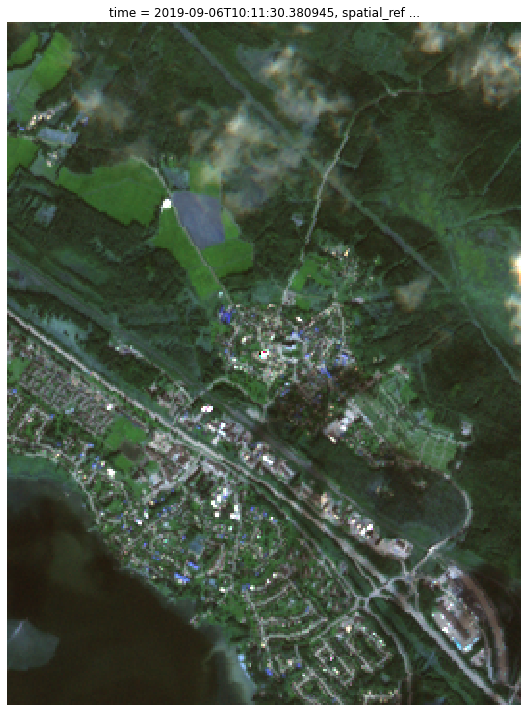

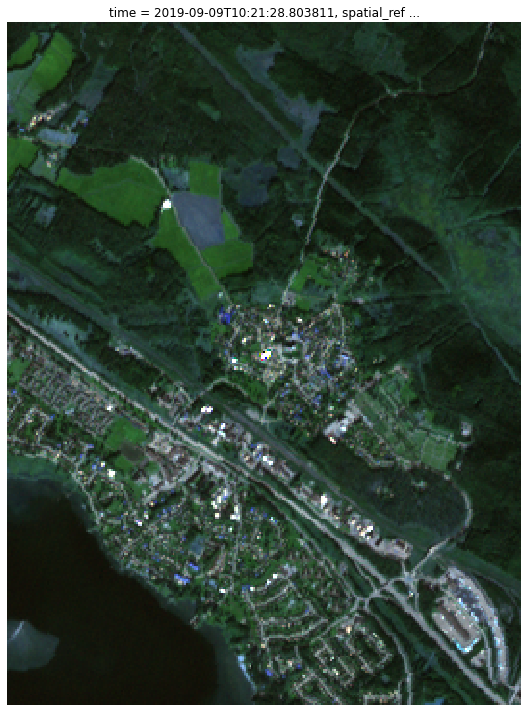

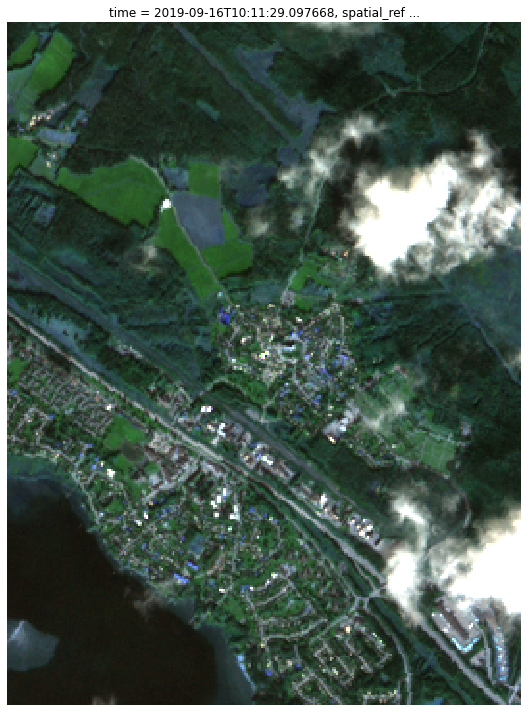

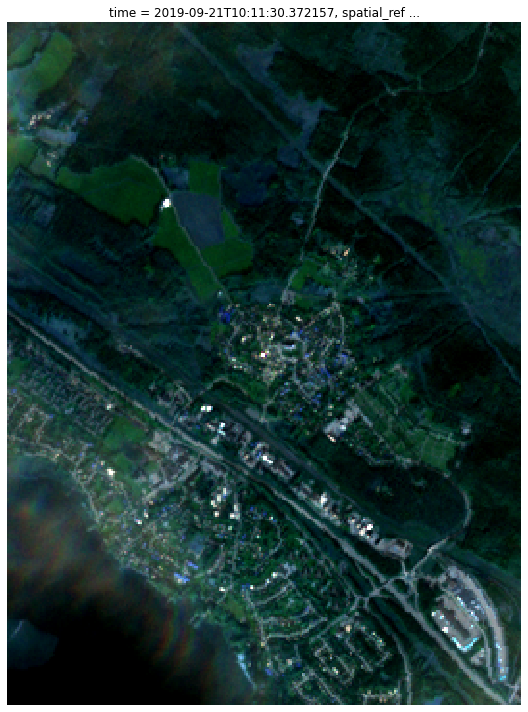

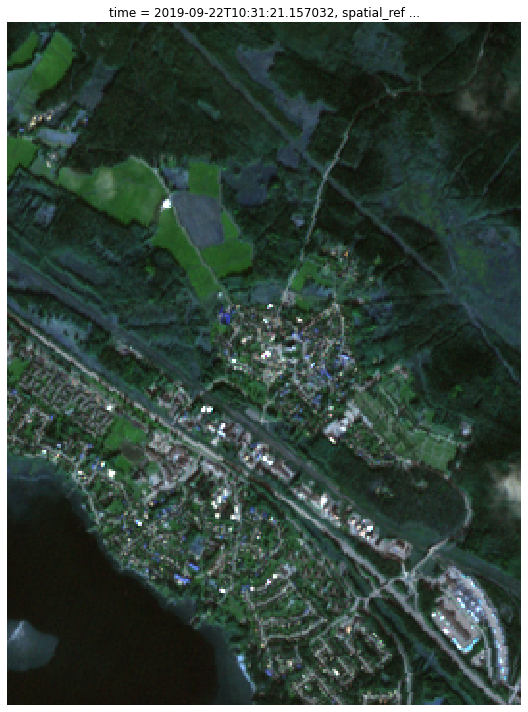

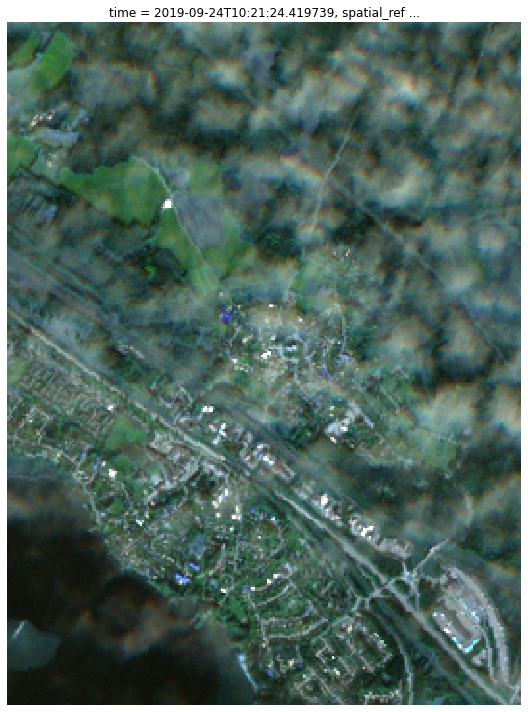

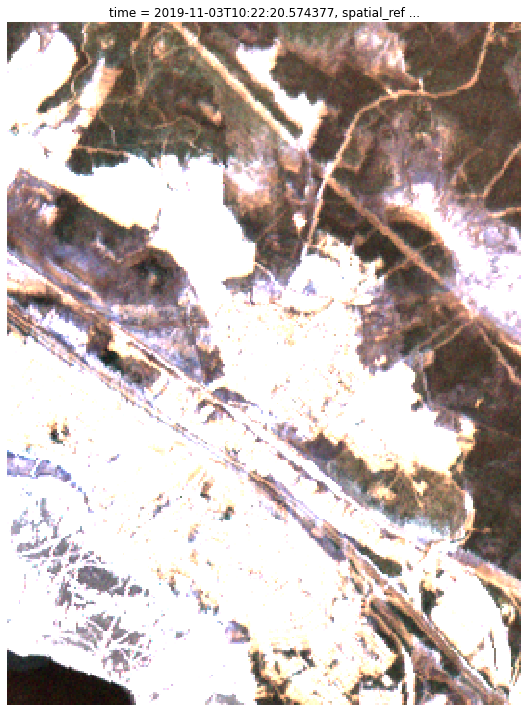

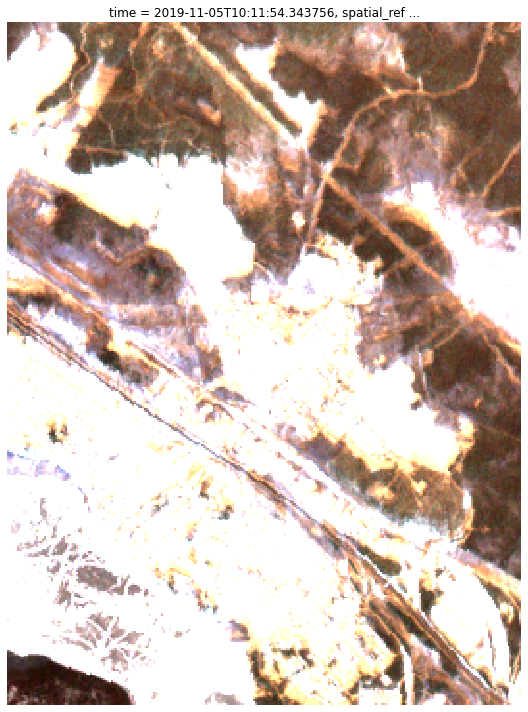

In [47]:
for index in np.arange(fds.time.size):
    plot_rgb(fds, index, 10)

# 4) Image clustering

## 4.1) Clustering method for rgb image

Define a method for clustering the satellite images from the data we loaded

In [89]:
def cluster_rgb(ds, cluster_no, normalize=False, hsv=False):
    #Go through all images, and reshape them for clustering
    for index in range(0,ds.time.size):
        #Create an image from the satellite data
        img = (ds[["B02_10m", "B03_10m", "B04_10m"]]).to_array().isel(time = index).values
        #Most images have the rgb as the last dimension, so we reshape the image accordingly        
        img = np.moveaxis(img, 0, -1)    
        #reshape again, this time for clustering purposes
        new_shape = (img.shape[0]*img.shape[1],img.shape[2])
        X_current = np.reshape(img, new_shape)
        if (index==0):
            X = X_current
            img_size = X.shape[0]
        else:
            X = np.append(X,X_current,axis=0)                            
    if normalize:                
        #Clip values at max 10 000    
        X[np.where(X>10000)]=10000
        #Go from 1 to 10000 to 0 to 1
        X=X/10000
        if hsv:
            #Turn bgr to rgb
            X_rgb = np.flip(X,axis=1)
            X_hsv = rgb_to_hsv(X_rgb)
            X = np.append(X,X_hsv,axis=1)
    #define k-means based on the number of clusters we want
    k_means = cluster.KMeans(n_clusters = cluster_no)
    #run k-means
    k_means.fit(X)
    #get the results
    X_cluster = k_means.labels_
    #Fit the results into the appropriate amount of images
    X_cluster_images = np.zeros(shape=(ds.time.size,img.shape[0],img.shape[1]))
    #Go through all the results
    for index in range(0,ds.time.size):
        X_cluster_now = X_cluster[index*img_size:(index+1)*img_size]
        X_cluster_images[index,:,:] = X_cluster_now.reshape(img[:,:,0].shape)
    return X, X_cluster_images

## 4.2) Method for visualization

Define a method that would visualize the satellite image and the clustered image side by side

In [90]:
def plot_rgb_cluster(ds, index, clustered_1, clustered_2, size):
    if (ds.dims['x'] > ds.dims['y']):
        ratio = size/ds.dims['x']
        plt.figure(figsize = (size*3,ds.dims['y']*ratio))
    elif (ds.dims['y'] > ds.dims['x']):
        ratio = size/ds.dims['y']
        plt.figure(figsize = (ds.dims['x']*ratio*3,size))
    #If the sides are equal, we can use a figure with equal sides
    else:        
        plt.figure(figsize = (size*2,size))    
    
    ax1 = plt.subplot(1,3,1)
    (ds[["B02_10m", "B03_10m", "B04_10m"]]).to_array().isel(time = index).plot.imshow(vmin=0,vmax=2000, ax=ax1)#
    plt.axis("off")
    plt.title('$RGB$',fontsize=25)
    
    ax2 = plt.subplot(1,3,2)
    plt.imshow(np.flip(clustered_1[index,:],1), cmap=cmap_scl, origin="lower")
    plt.title('$Clusters$',fontsize=25)
    plt.axis("off")
    
    ax2 = plt.subplot(1,3,3)
    plt.imshow(np.flip(clustered_2[index,:],1), cmap=cmap_scl, origin="lower")
    plt.title('$Clusters$',fontsize=25)
    plt.axis("off")
    
    plt.tight_layout()
    plt.show()

## 4.3) Run the clustering and visualize some results

In [91]:
cluster_no = 12
X_norm, Clustered_norm = cluster_rgb(fds, cluster_no, True, False)
X_norm_hsv, Clustered_norm_hsv = cluster_rgb(fds, cluster_no, True, True)

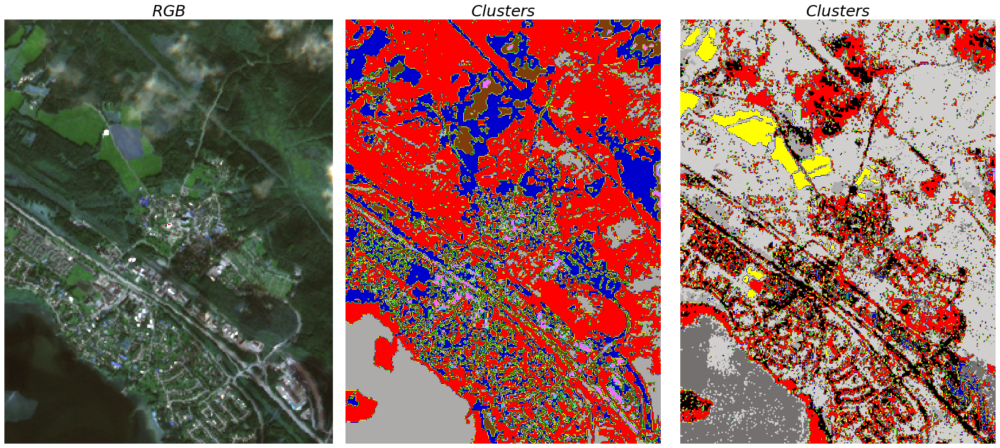

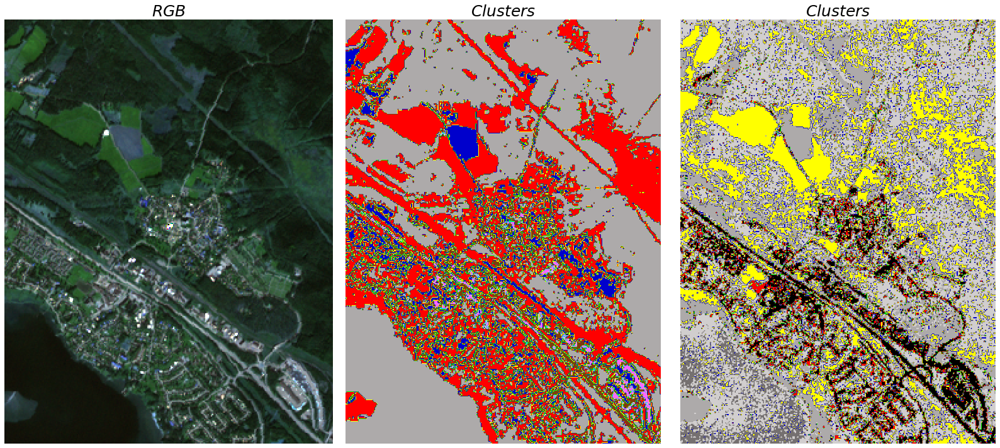

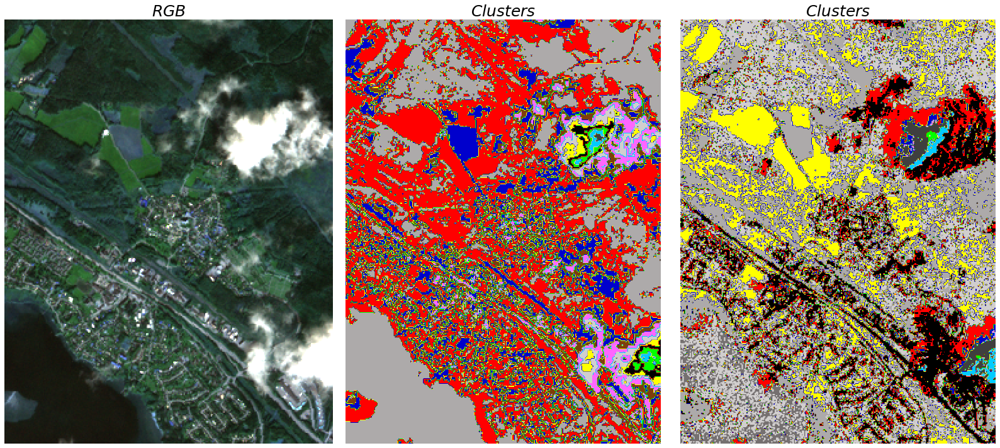

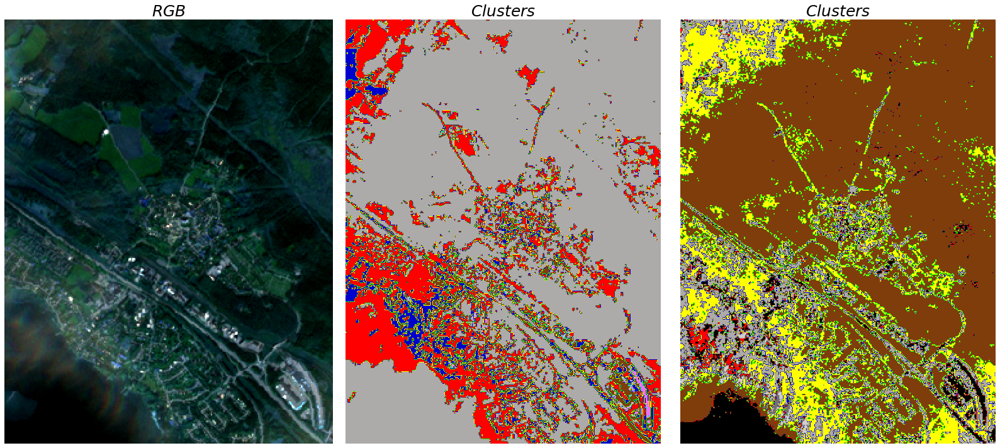

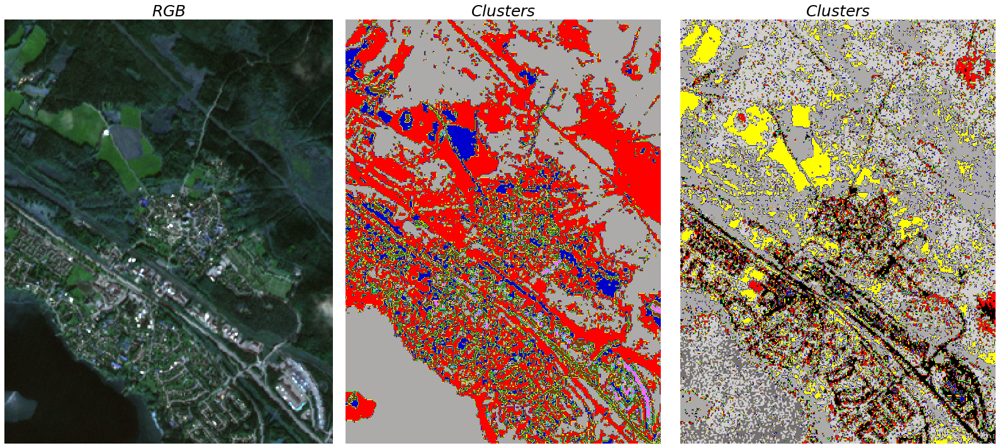

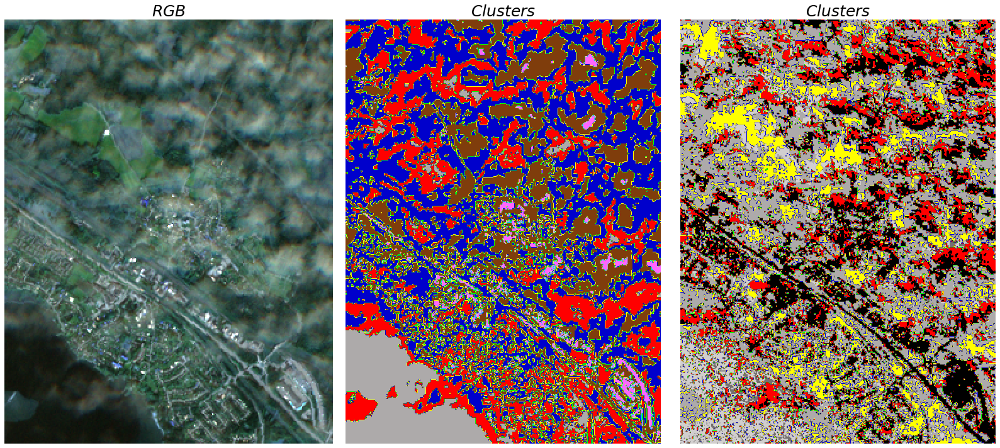

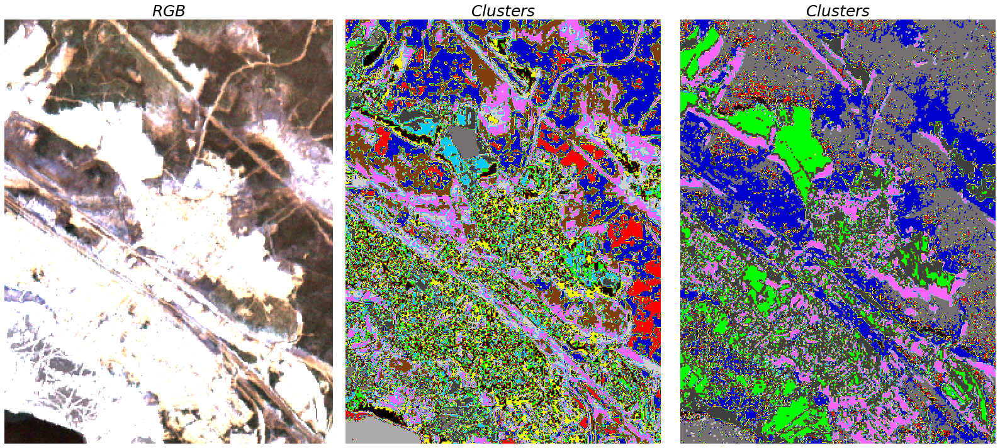

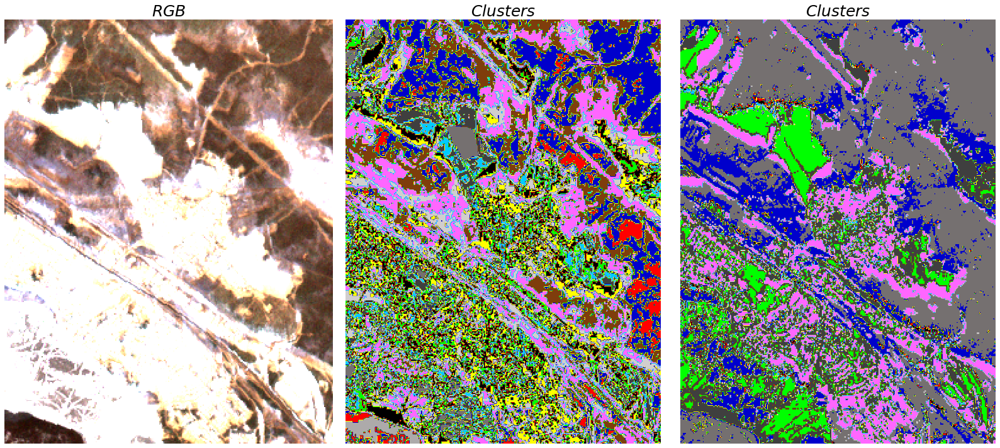

In [92]:
for index in np.arange(fds.time.size):
    plot_rgb_cluster(fds,index, Clustered_norm, Clustered_norm_hsv, 10)

# 5) Using more bands

## 5.1) Redefine the query

In [93]:
lat = (65.63, 65.66)
lon = (22.00, 22.05)

measurements = ["AOT_10m", "B02_10m", "B03_10m", "B04_10m", "B08_10m", "WVP_10m", "B05_20m", "B06_20m", "B07_20m", "B11_20m", "B12_20m", "B8A_20m", "CLDPRB_20m", "SCL_20m", "SNWPRB_20m", "B01_60m", "B09_60m"]
start_date = "2019-09-05"
end_date = "2019-11-06"

ds_general = query_data(lat, lon, measurements, start_date, end_date)

In [94]:
filtered_general, fds_general = remove_invalid(ds_general, 50)

 0	 82%	Added
 1	  0%
 2	 92%	Added
 3	  3%
 4	  0%
 5	 32%
 6	 80%	Added
 7	  0%
 8	 44%
 9	 59%	Added
10	 82%	Added
11	 78%	Added
12	  4%
13	  1%
14	  0%
15	  0%
16	 18%
17	  0%
18	  0%
19	  0%
20	  0%
21	  7%
22	  0%
23	 43%
24	  0%
25	  0%
26	  0%
27	  0%
28	 33%
29	  0%
30	  0%
31	  0%
32	 19%
33	  2%
34	 10%
35	 61%	Added
36	 62%	Added


In [95]:
fds_general

<xarray.Dataset>
Dimensions:      (time: 8, x: 267, y: 359)
Coordinates:
  * time         (time) datetime64[ns] 2019-09-06T10:11:30.380945 ... 2019-11...
  * y            (y) float64 7.297e+06 7.297e+06 7.297e+06 ... 7.3e+06 7.3e+06
  * x            (x) float64 8.241e+05 8.241e+05 ... 8.214e+05 8.214e+05
    spatial_ref  int32 3006
Data variables:
    AOT_10m      (time, y, x) uint16 84 84 84 84 84 84 ... 204 204 204 204 204
    B02_10m      (time, y, x) uint16 400 378 414 429 602 ... 738 745 680 722 670
    B03_10m      (time, y, x) uint16 471 500 527 622 715 ... 630 531 531 479 487
    B04_10m      (time, y, x) uint16 415 442 511 523 699 ... 504 448 343 367 401
    B08_10m      (time, y, x) uint16 1340 1476 2084 2390 ... 1958 1488 1788 1720
    WVP_10m      (time, y, x) uint8 255 255 255 255 255 ... 255 255 255 255 255
    B05_20m      (time, y, x) uint16 531 819 834 1058 1058 ... 766 630 630 645
    B06_20m      (time, y, x) uint16 951 1686 1333 1740 ... 1477 1359 1359 1341
    B07_20m      (time, y, x) uint16 1205 1943 1515 1991 ... 1724 1679 1679 1435
    B11_20m      (time, y, x) uint16 723 1233 1059 1412 1412 ... 283 212 212 164
    B12_20m      (time, y, x) uint16 555 757 790 1032 1032 ... 179 181 181 160
    B8A_20m      (time, y, x) uint16 1310 2094 1816 2172 ... 1786 1715 1715 1410
    CLDPRB_20m   (time, y, x) uint8 0 0 0 1 1 5 5 6 6 9 ... 6 5 5 4 4 4 4 2 2 2
    SCL_20m      (time, y, x) uint8 4 4 4 4 4 7 7 7 7 7 ... 7 7 7 7 7 7 7 7 7 7
    SNWPRB_20m   (time, y, x) uint8 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0
    B01_60m      (time, y, x) uint16 569 569 569 569 569 ... 722 722 722 722 722
    B09_60m      (time, y, x) uint16 1736 1736 1736 1736 ... 1881 1881 1881 1881
Attributes:
    crs:           epsg:3006
    grid_mapping:  spatial_ref

## 5.2) General clustering

Here, we have more flexibility in the use of bands/products for clustering

In [96]:
def cluster_rgb_general(ds, bands, cluster_no, normalization = False):
    #Go through all images, and reshape them for clustering
    for index in range(0,ds.time.size):
        #Create an image from the satellite data
        img = (ds[bands]).to_array().isel(time = index).values
        #Most images have the rgb as the last dimension, so we reshape the image accordingly        
        img = np.moveaxis(img, 0, -1)    
        #reshape again, this time for clustering purposes
        new_shape = (img.shape[0]*img.shape[1],img.shape[2])
        X_current = np.reshape(img, new_shape)
        if (index==0):
            X = X_current
            img_size = X.shape[0]
        else:
            X = np.append(X,X_current,axis=0)            
    #define k-means based on the number of clusters we want    
    if normalization:
        X = (X-np.mean(X, axis=0))/np.var(X,axis=0)    
    k_means = cluster.KMeans(n_clusters = cluster_no)
    #run k-means
    k_means.fit(X)        
    X_cluster = k_means.predict(X)        
    #Fit the results into the appropriate amount of images
    X_cluster_images = np.zeros(shape=(ds.time.size,img.shape[0],img.shape[1]))
    #Go through all the results
    for index in range(0,ds.time.size):
        X_cluster_now = X_cluster[index*img_size:(index+1)*img_size]
        X_cluster_images[index,:,:] = X_cluster_now.reshape(img[:,:,0].shape)    
    return X, X_cluster_images

## 5.3) Extended plotting

Plotting here also includes the scene classification layer for comparison

In [97]:
def plot_rgb_cluster_scl(ds, index, clustered_image, size):
    if (ds.dims['x'] > ds.dims['y']):
        ratio = size/ds.dims['x']
        plt.figure(figsize = (size*3,ds.dims['y']*ratio))
    elif (ds.dims['y'] > ds.dims['x']):
        ratio = size/ds.dims['y']
        plt.figure(figsize = (ds.dims['x']*ratio*3,size))
    #If the sides are equal, we can use a figure with equal sides
    else:        
        plt.figure(figsize = (size*3,size))    
    
    ax1 = plt.subplot(1,3,1)
    flat = (ds[["B02_10m", "B03_10m", "B04_10m"]]).to_array().isel(time = index).values.ravel()
    flat.sort()        
    (ds[["B02_10m", "B03_10m", "B04_10m"]]).to_array().isel(time = index).plot.imshow(vmin=0,vmax=2000, ax=ax1)#
    plt.axis("off")
    plt.title('$RGB$',fontsize=25)
    
    ax2 = plt.subplot(1,3,2)
    plt.imshow(np.flip(clustered_image[index,:],1), cmap=cmap_scl, origin="lower")
    plt.title('$Clusters$',fontsize=25)
    plt.axis("off")
    
    ax3 = plt.subplot(1,3,3)
    ds.isel(time=index).SCL_20m.plot( cmap=cmap_scl,norm=norm_scl, ax=ax3)#
    plt.title('$SCL$',fontsize=25)
    plt.axis("off")
    
    #plt.suptitle(str(ds.isel(time=index).time.values), fontsize=20)
    
    plt.tight_layout()
    plt.show()

## 5.4) Execution

In [98]:
clustering_measurements = ["B02_10m", "B03_10m", "B04_10m", "B08_10m", "B05_20m", "B06_20m", "B07_20m", "B11_20m", "B12_20m", "B8A_20m"]

cluster_no = 12
X_gen_norm, Clustered_gen_norm = cluster_rgb_general(fds_general, clustering_measurements, cluster_no, True)

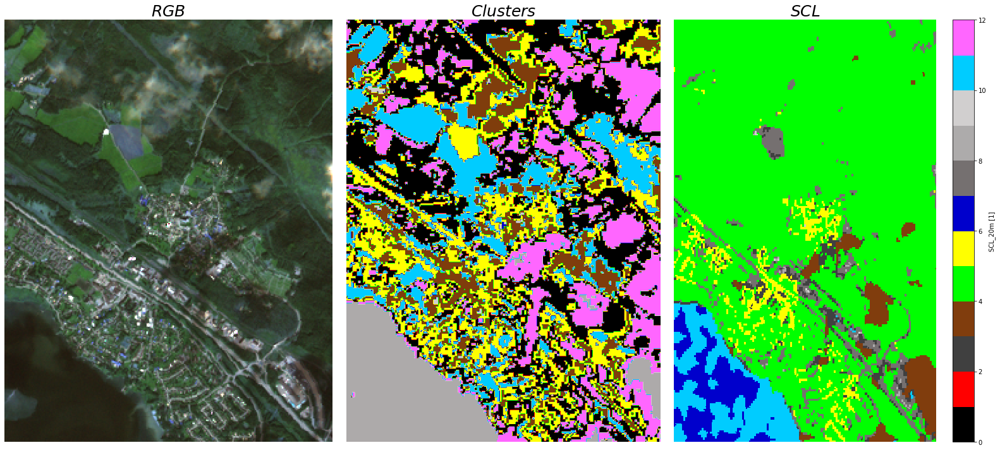

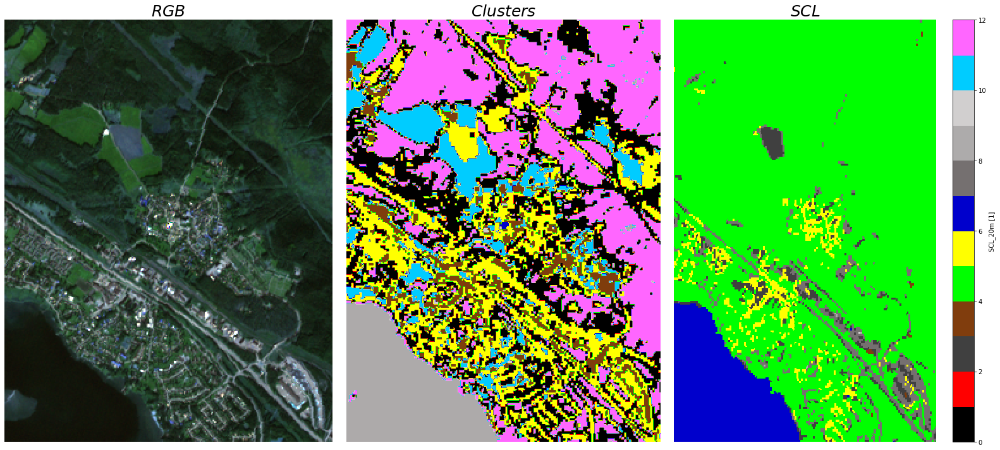

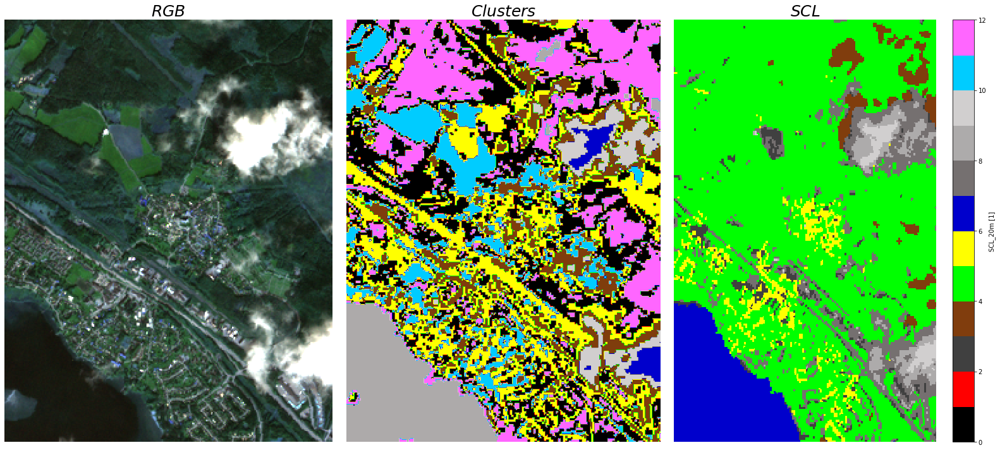

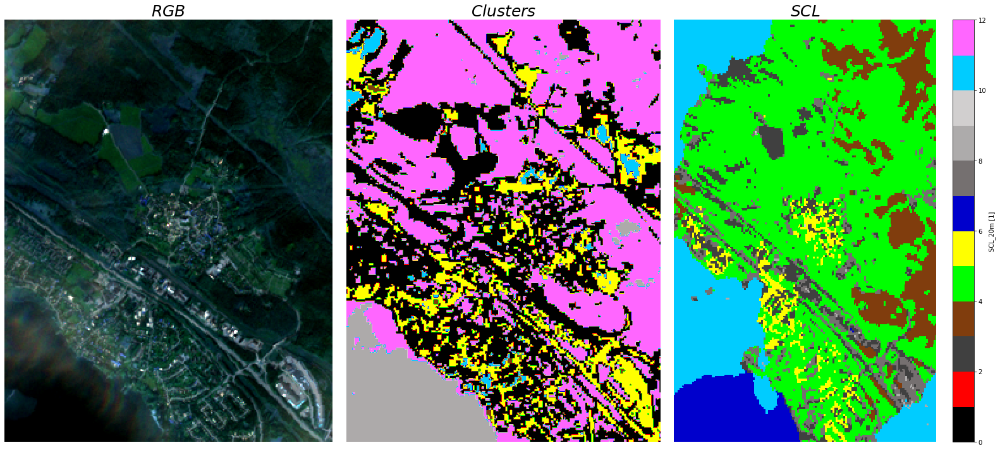

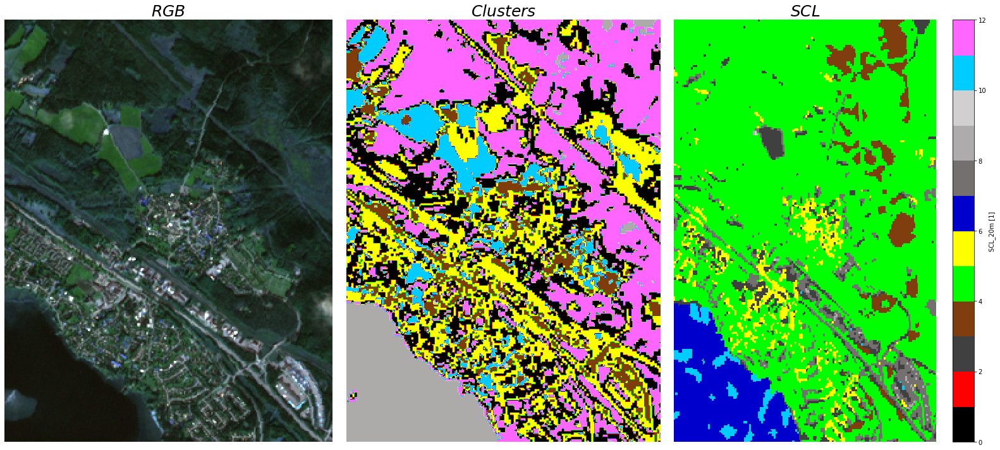

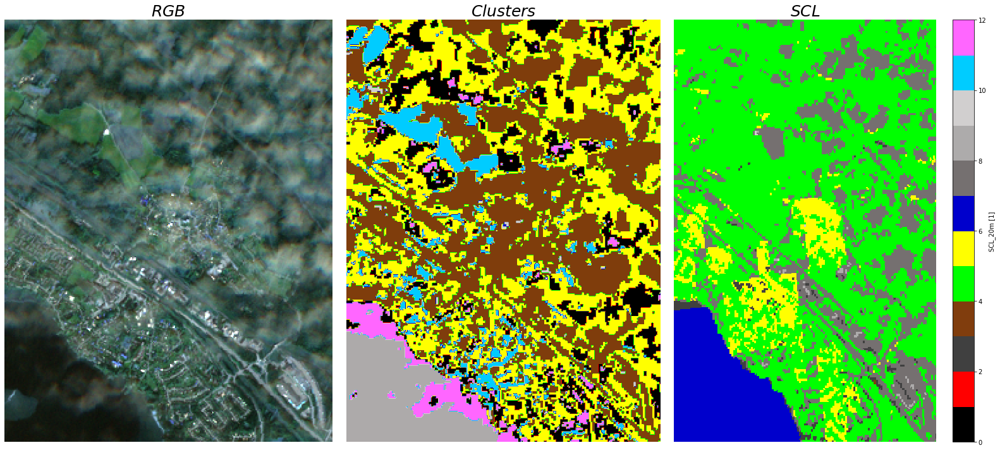

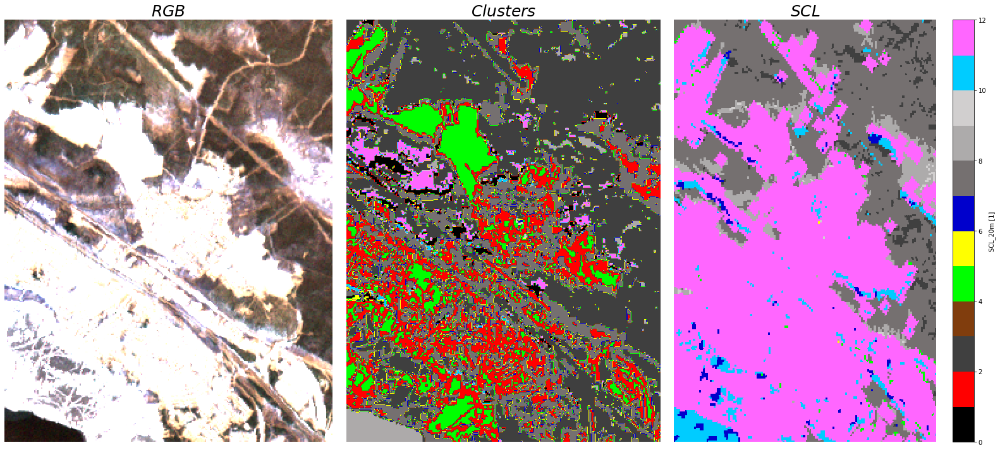

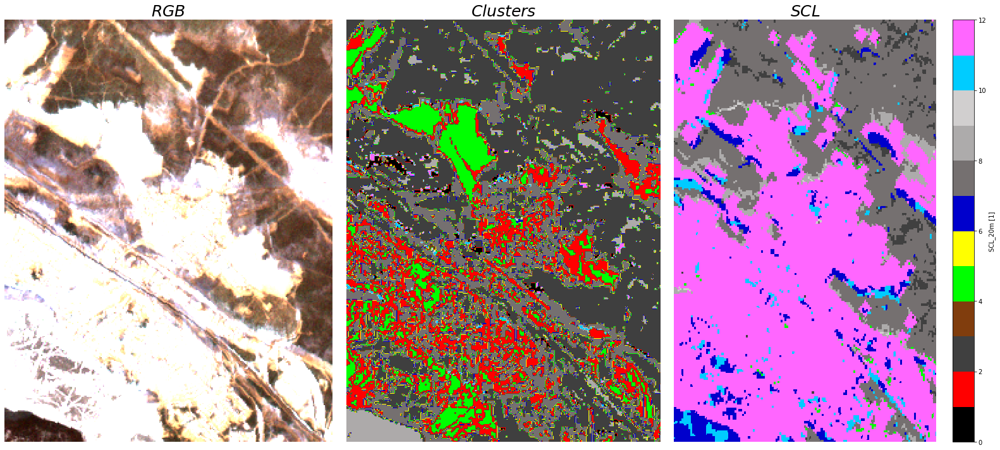

In [99]:
for index in np.arange(fds.time.size):
    plot_rgb_cluster_scl(fds_general,index, Clustered_gen_norm, 10)    